In [1]:
from SystemConfig import prepare_Task
from XRay_DataSet import get_Data_Set, Xray_CardioMegalyDataSetConfig


Task = "Segmentation"
Name = "Cardiomegaly"
DataSet = "Generated_Data_20180410_191400_Seg_Base_Expand_20pixel_Cropped"
ImgShape = (1024,1024, 1)


Classes = []
Classes = ["BG"]
Classes.append("Rt Upper CB")
#Classes.append("Rt Lower CB")

GPU_Num, BaseDataSetPath = prepare_Task(Task)

datasetConfig = Xray_CardioMegalyDataSetConfig(Name, ImgShape,  Classes, DataSet)
    
# dataset_train = get_Data_Set(datasetConfig, BaseDataSetPath, "train")
# dataset_val = get_Data_Set(datasetConfig, BaseDataSetPath, "validation")
# dataset_test = get_Data_Set(datasetConfig, BaseDataSetPath, "test")

In [2]:
import DataSet
test_data, test_files, test_labels, mean, std= DataSet.get_Data_Set_Segmentaion(datasetConfig, BaseDataSetPath,"Rt Upper CB","aa")

/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/importlib/_bootstrap.py:321: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  return f(*args, **kwds)
Using TensorFlow backend.


/data/gyungchan2110/Segmentation/Generated_Data_20180410_191400_Seg_Base_Expand_20pixel_Cropped/Imgs/aa
aa 15
 : --- 0.6382160186767578 seconds ---


In [3]:
import matplotlib.pyplot as plt
import cv2
import visualize
import numpy as np
import random
import model as modellib
from PostProcessing import GetMostProperMask
from XRay_DataSet import Xray_CardioMegalyModelConfig

ROOT_DIR = BaseDataSetPath + "/MaskRCNN_LOGS"
MODEL_DIR = ROOT_DIR + "/Models"
LOG_DIR = ROOT_DIR + "/logs"

ModelFileName = "MaskRCNN_Rt Upper CB_20180410_202127.hdf5"

Classes = []
Classes = ["BG"]
Classes.append("Rt Upper CB")
#Classes.append("Rt Lower CB")

modelConfig = Xray_CardioMegalyModelConfig(len(Classes) -1 , 1024, 1)
#modelConfig.display()
# modelConfig.IMAGE_PADDING = True
# modelConfig.EPOCHS = 50
# modelConfig.BATCH = 1
# modelConfig.LEARNIING_MODE = "scratch"


model = modellib.MaskRCNN(mode="inference", model_dir=LOG_DIR, config=modelConfig)
model.load_weights(MODEL_DIR + "/" + ModelFileName, by_name=True)
    
# # #for i, image in enumerate(test_data):
    
# # # image = random.choice(test_data)
# # # image = np.asarray(image)
# # #     print(image.shape)
# # #image = np.expand_dims(image,-1)
# # # Run detection
results = model.detect_All(test_data, verbose=1)
    
    
results = GetMostProperMask(results, Classes)
#visualize.display_instances(test_data[-4], re['rois'], re['masks'], re['class_ids'], Classes, re['scores'])
#     break
    


Processing 15 images
image                    shape: (1024, 1024, 1)       min:    4.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:    0.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:    3.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   15.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   15.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   17.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   24.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   28.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   29.00000  max:  254.00000
image                    shape: (1024, 1024, 1)       min:   18.00000  max:  255.00000
image                    shape: (1024, 1024, 1)       min:   28.00000  max:  255.00000
image                 

1 1 1


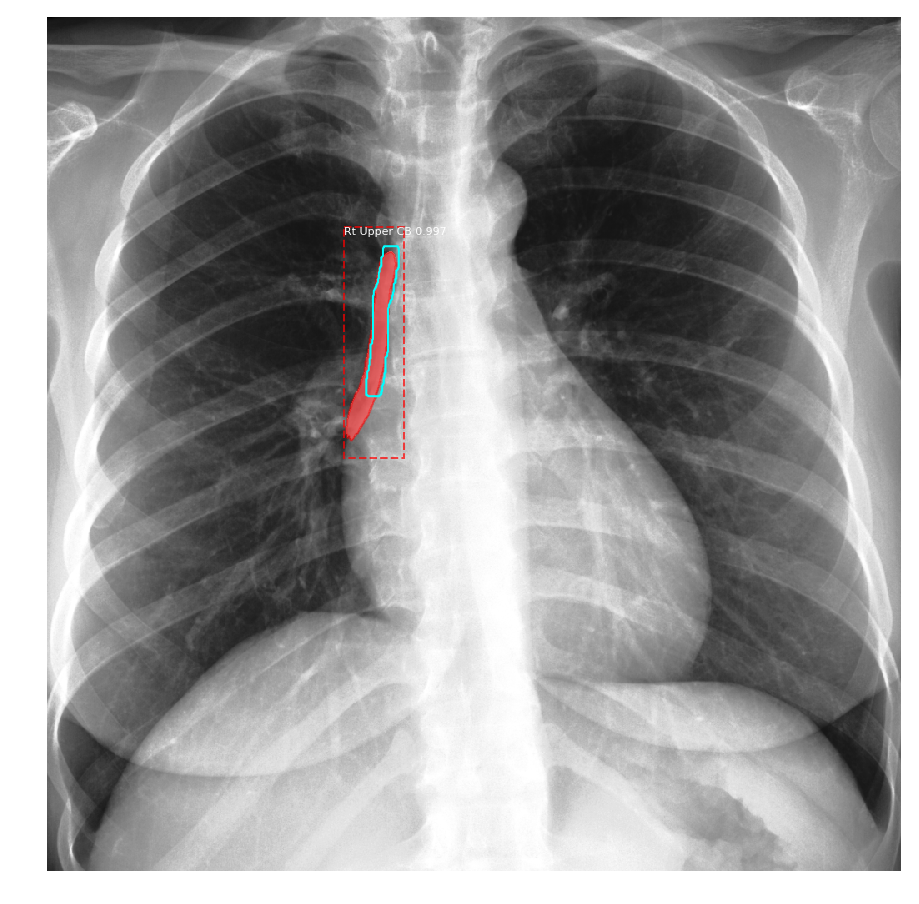

1 1 1


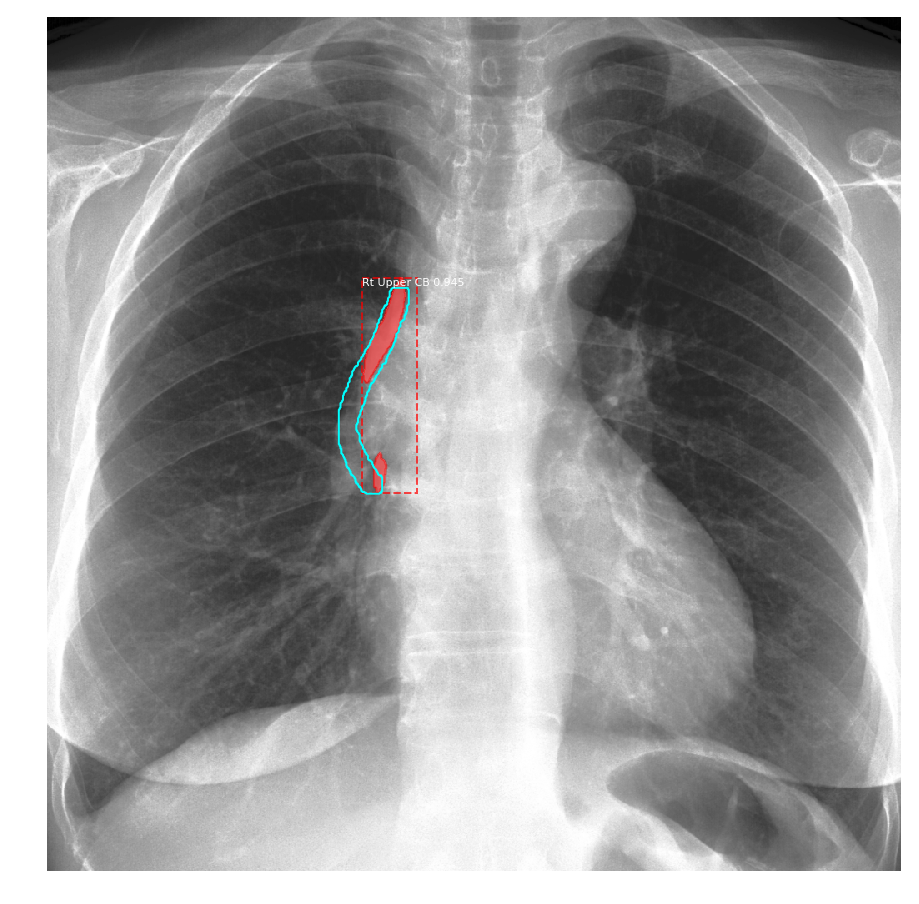

1 1 1


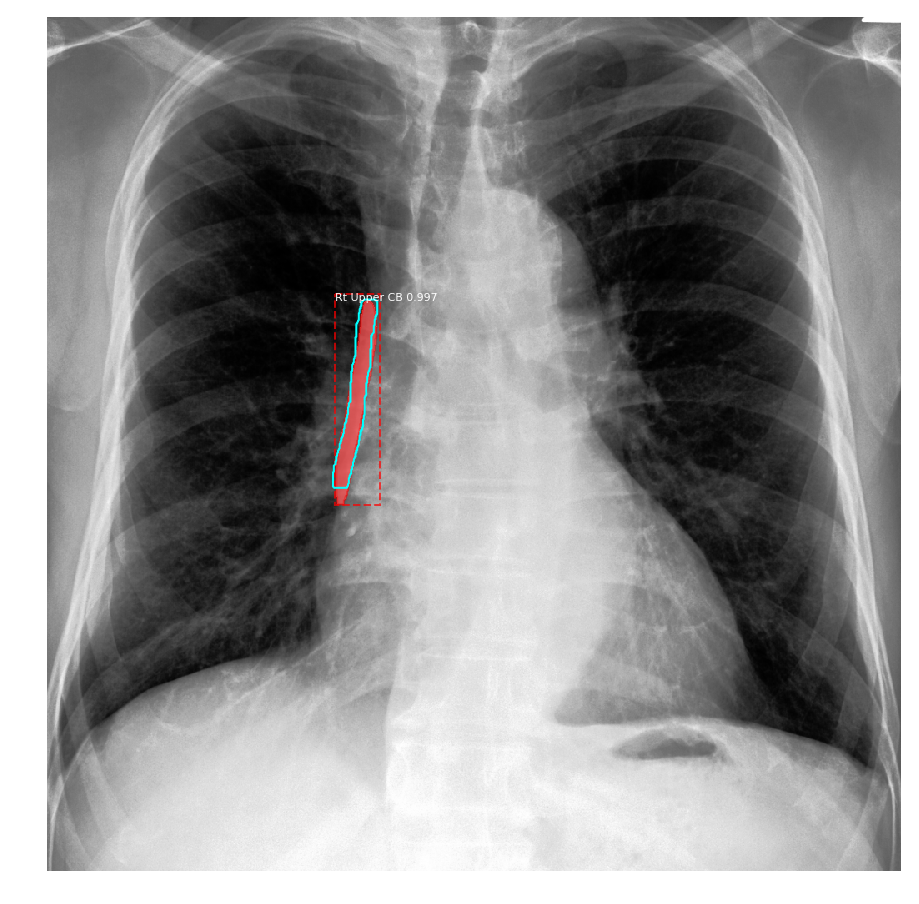

1 1 1


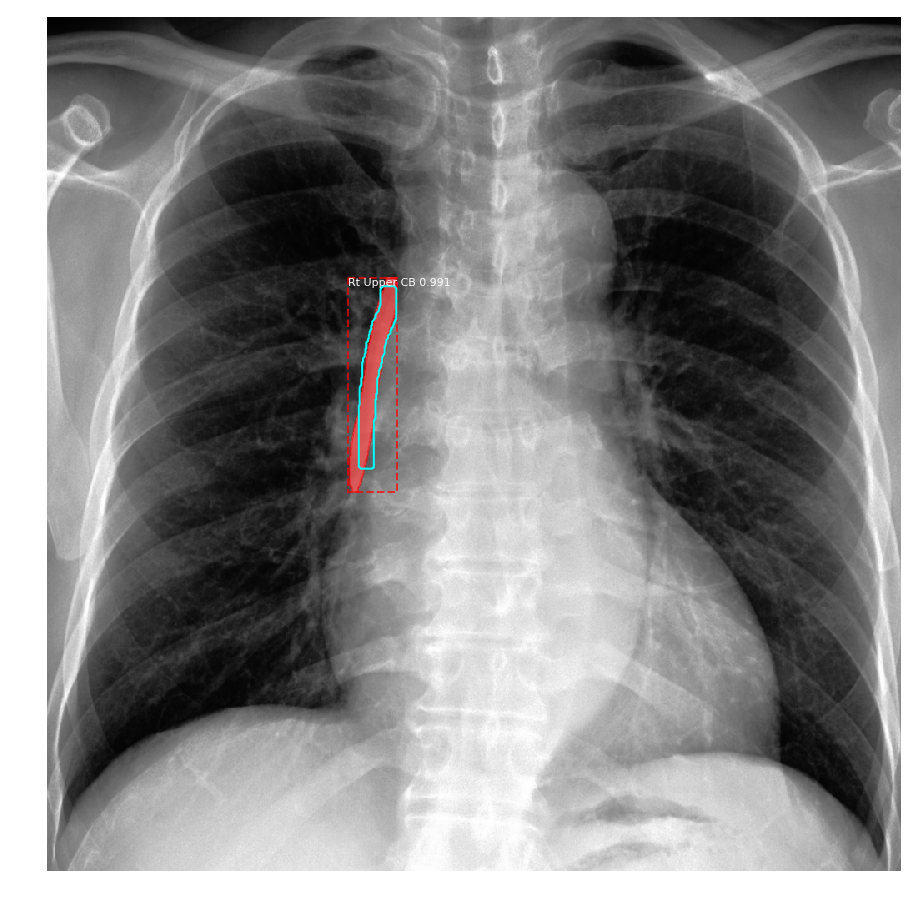

1 1 1


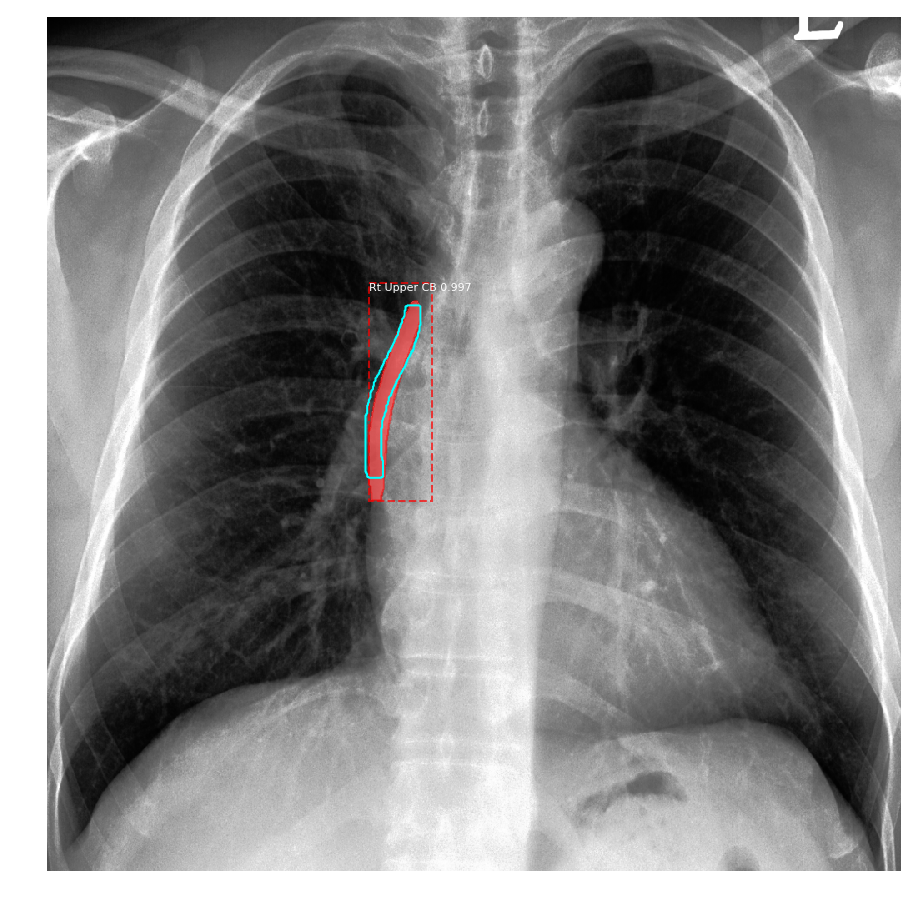

1 1 1


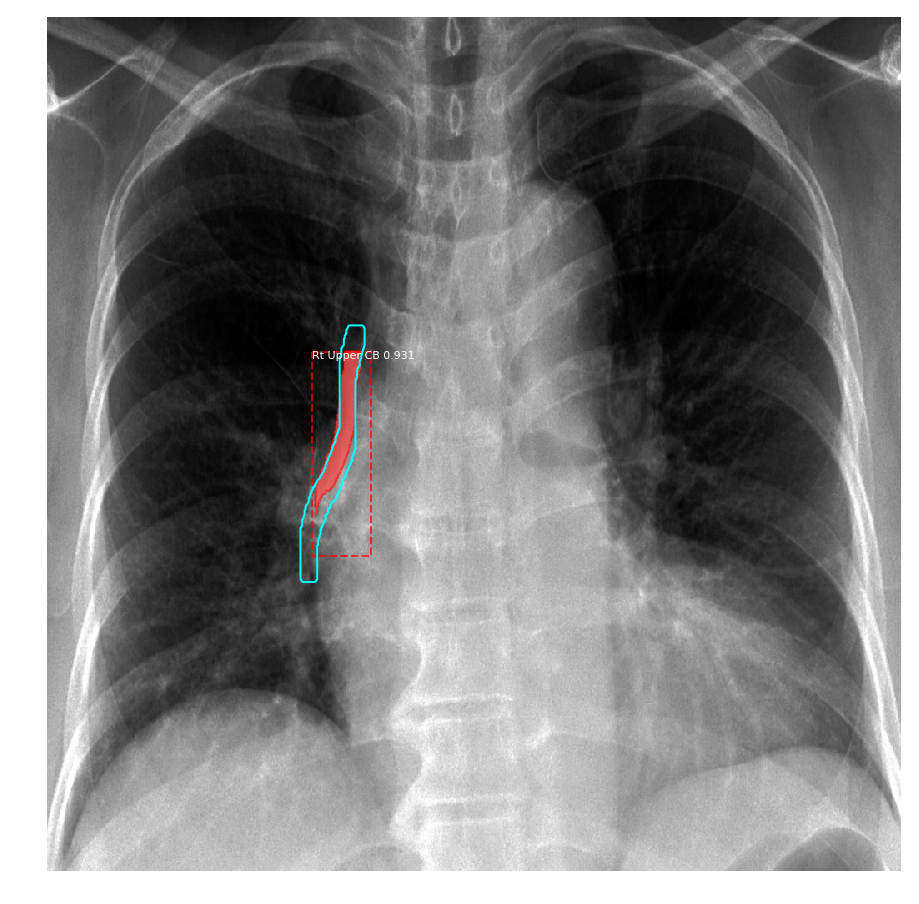

1 1 1


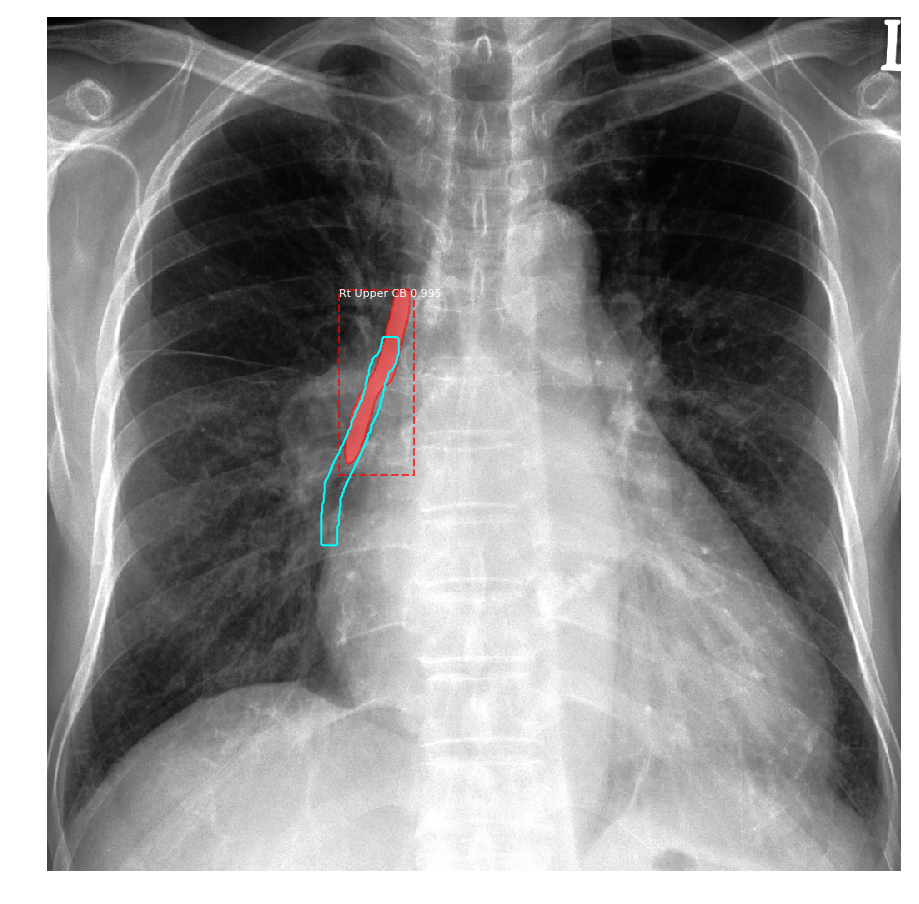

1 1 1


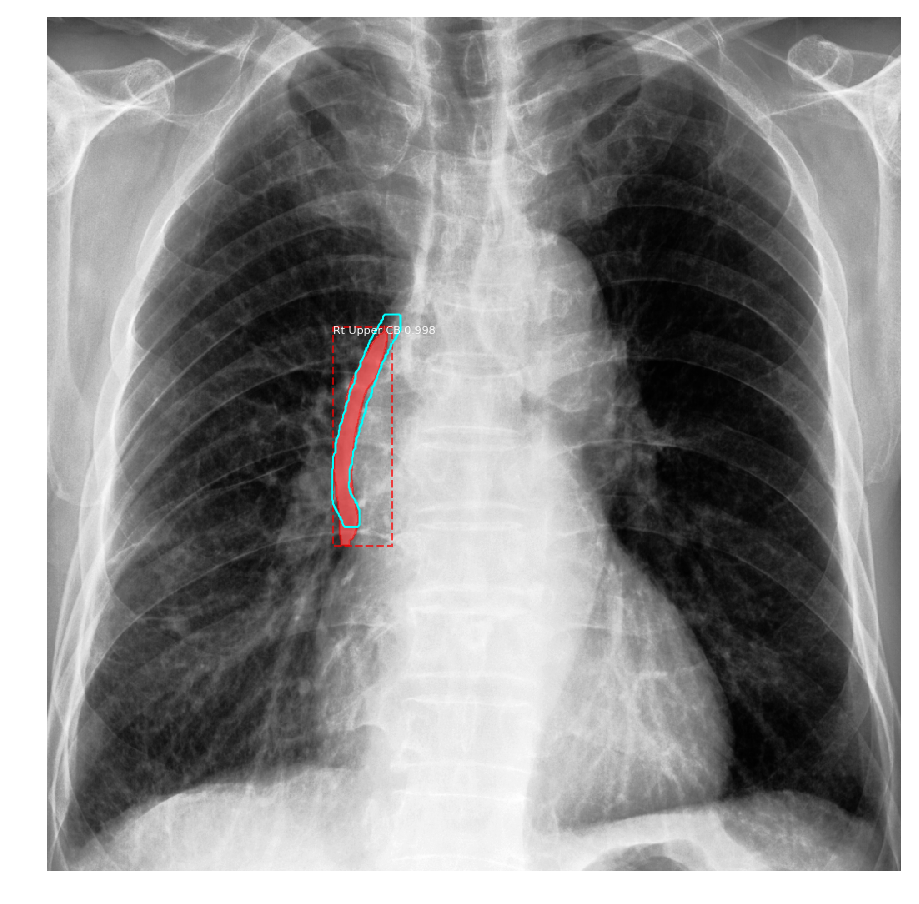

1 1 1


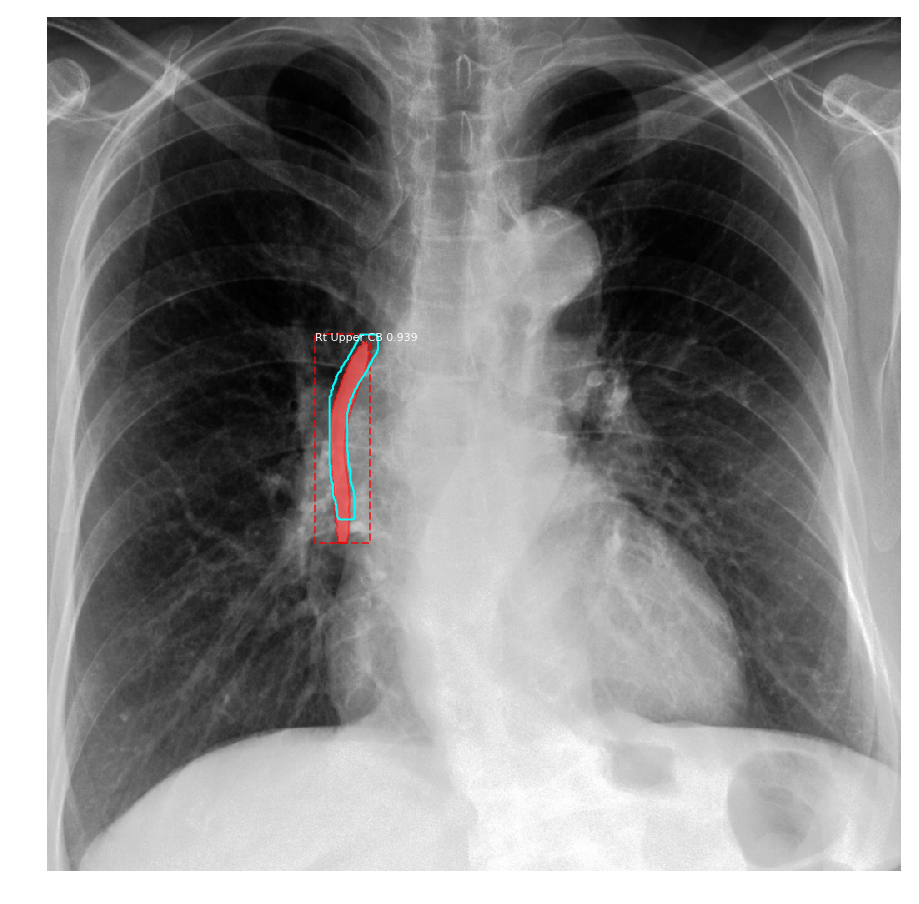

1 1 1


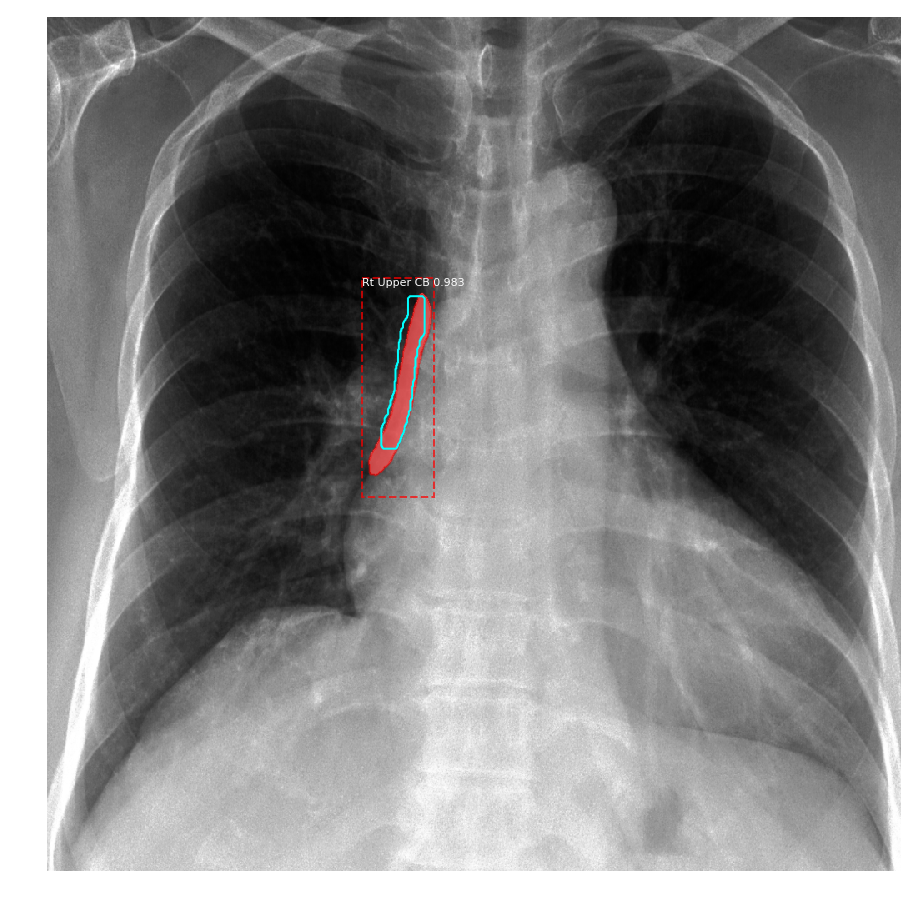

1 1 1


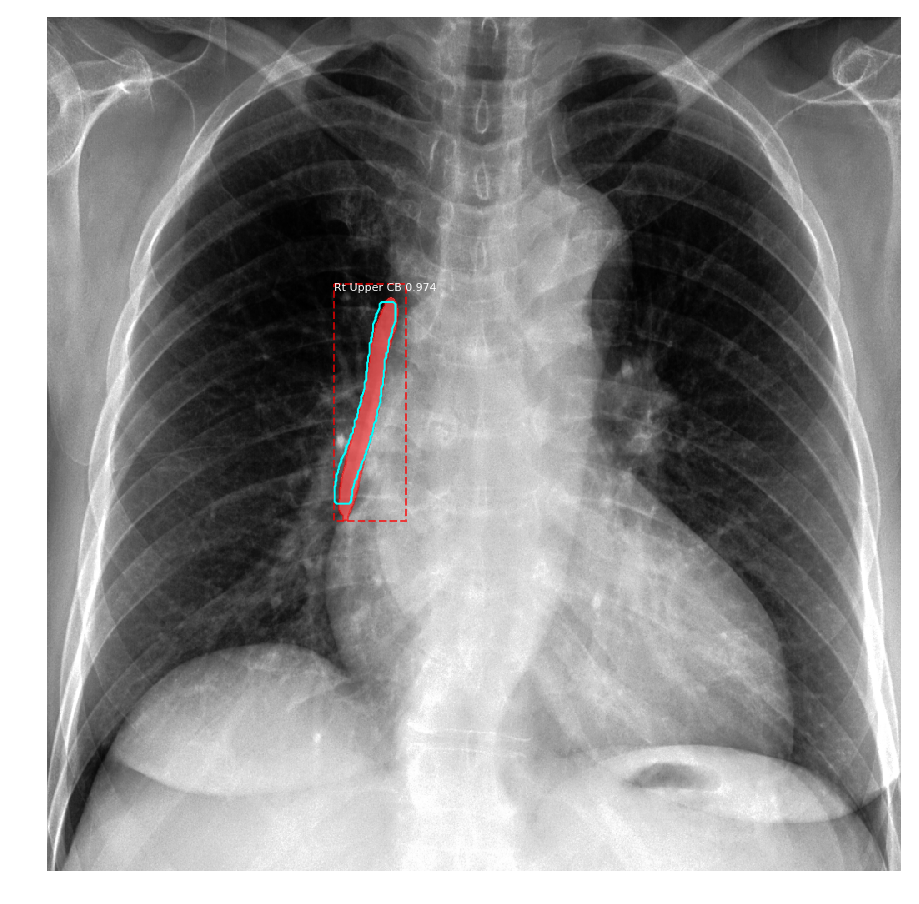

1 1 1


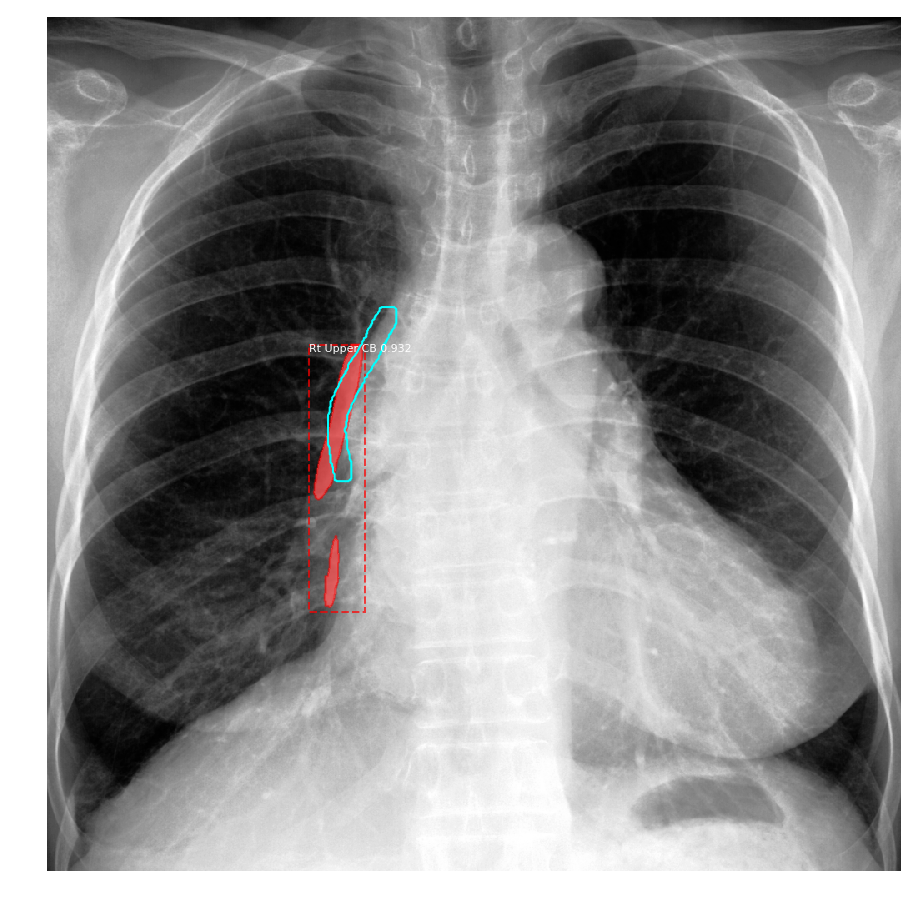

1 1 1


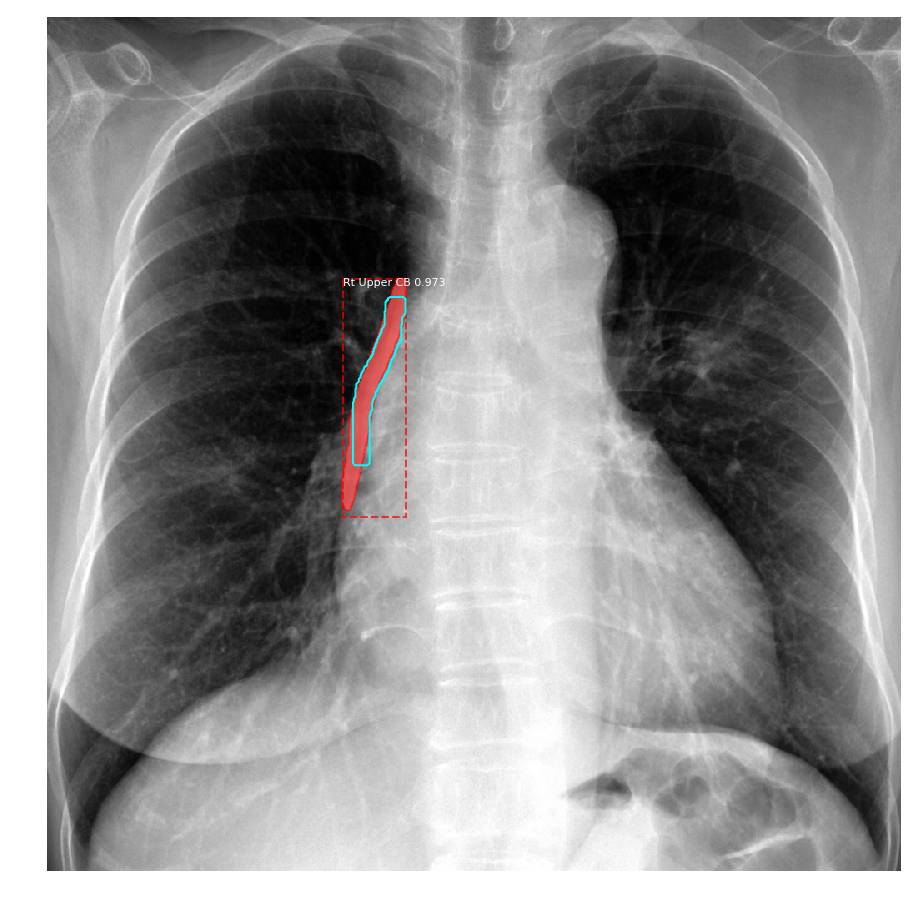

1 1 1


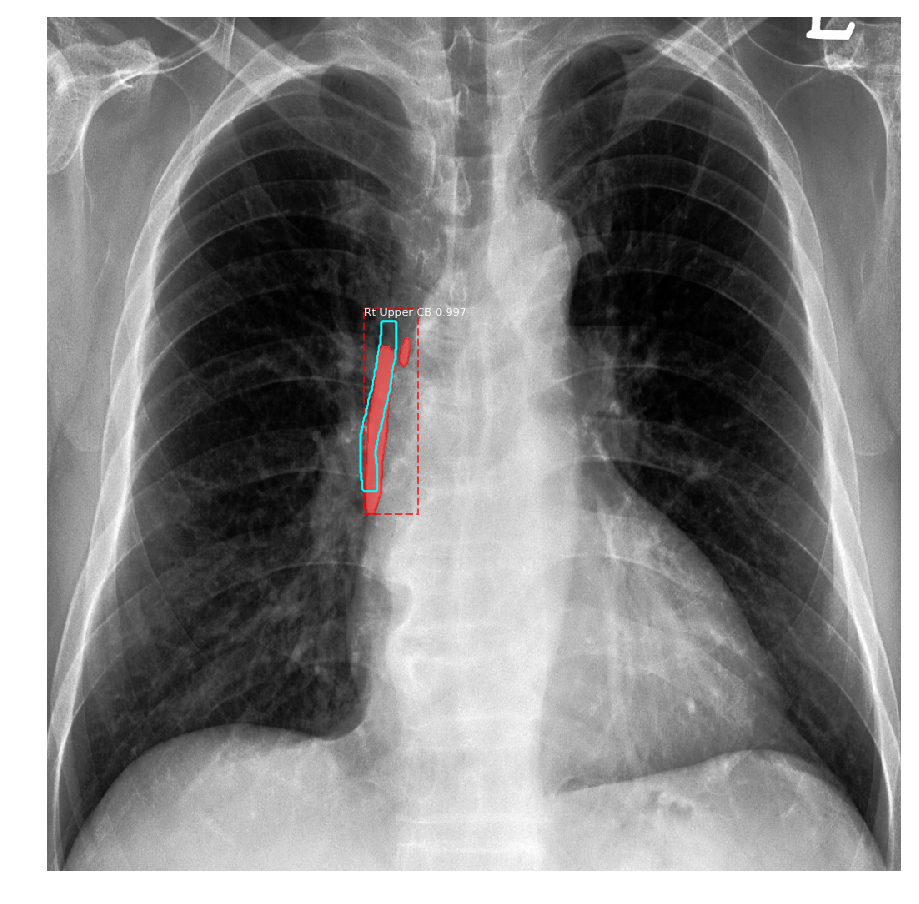

1 1 1


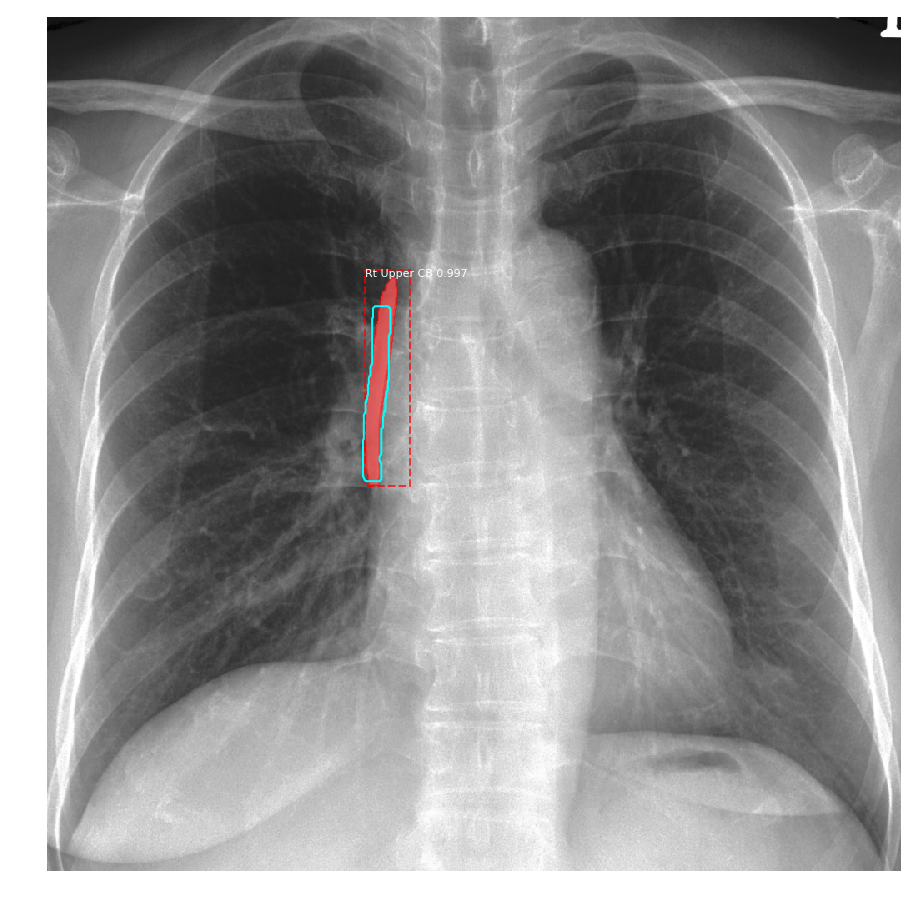

In [4]:
for i, result in enumerate(results):
    visualize.display_instances(test_data[i], result['rois'], result['masks'], result['class_ids'], Classes, result['scores'], truemask = test_labels[i])

In [5]:
for re in results:
    score = re['scores']
    print(score)

[0.99712974]
[0.9451656]
[0.9965249]
[0.99064785]
[0.99746037]
[0.9314681]
[0.99472886]
[0.9975292]
[0.9394545]
[0.9833687]
[0.9737133]
[0.9315223]
[0.9729428]
[0.99694926]
[0.99682707]


In [6]:
#ious_ = np.nonzero(ious)
suma = 0.0
count = 0 
nonzero = []
for data in ious : 
    if(data != 0.0) :
        nonzero.append(data)
nonzero = np.asarray(nonzero)
print(nonzero.mean(), nonzero.std())


NameError: name 'ious' is not defined

In [ ]:
aa = np.ones(10)
print(aa)

x = np.where(aa == 0)
print(x)